# Bilal Qaisar

# Project Title: Garbage Image Classification

## Introduction

The purpose of this project is Garbage Type facilitation as this  will facilitate  practical field for model training and evaluation in the realm of waste classification and management, acting as a stepping stone towards building automated waste segregation systems, which are pivotal for efficient recycling and waste management processes, subsequently contributing to environmental conservation.

## About Dataset

The dataset for this project is downloaded from from Kaggle. The dataset contain 2527 images of garbage, categorized into six classes namely cardboard, glass, metal, paper, plastic and trash. The image dimension of each image is 512x384.

Project was carried in two phases 

To ensure uniformity and compatibility with the neural network architecture, extensive preprocessing was carried out:

Image Resizing: All images were resized to a standard dimension of 224x224 pixels. 

Conversion to Tensors: To work effectively with deep learning frameworks like PyTorch, the images were transformed into tensors, making them suitable for further processing.

Dataset Size: The dataset consists of 2527 images of garbage belonging to the six classes.
Class Labels: The class labels are represented as integers from 0 to 5, corresponding to the garbage classes which are cardboard, glass, metal, paper, plastic and trash.

Train-Test Split: An 80/20 data split was employed, with 2021 images for training and 506 images for testing the model.

## Neural Network Architecture

The developed neural network is a feedforward model with the following layers:

Input Layer: Accepts RGB images, hence the in_channels are set to 3.

Convolution Layer 1: Extracts features from input images.

Convolution Layer 2: Further refines features learned in the previous layer.

Linear Layer 1: A fully connected layer for feature mapping.

Linear Layer 2: A second fully connected layer.

Output Layer: Comprising 6 output neurons, corresponding to the number of classes. It predicts the class of the garbage.

## Training Details of Neural Network

Learning Rate was set to 0.001 for better training of model.

Batch Size: Five images per batch.

Epochs: ten epochs were chosen as it provided optimal results during training.

Loss Function: The cross-entropy loss was utilized for optimization.

## Results using Neural Network Architecture

Training Accuracy: The model achieved a training accuracy of 96.68% on the training dataset. This indicates that the model is able to accurately classify garbage image in the training set.

Testing Accuracy: On the test dataset, the model achieved an accuracy of 44.27%. While the accuracy is much lower compared to the training set, which was lower than expected.

# 2nd Phase using pretrained VGG 13 Model

In the first phase, I  used Neural Network which yielded lower than expected accuracy (i.e. 44.27%), so in 2nd phase, I used pretrained VGG 13 model to get better accuracy.

# Training details of pretrained VGG 13 Model

Learning Rate was set to 0.001 for better training of model.

Batch Size: sixty four images per batch.

Epochs: ten epochs were chosen as it provided optimal results during training.

Loss Function: The cross-entropy loss was utilized for optimization.

# Results using VGG 13 Model

Testing Accuracy: On the test dataset, the model achieved an accuracy of 91.11%. This accuracy is much better as compared to the accuracy of Neural Network in first phase that was 44.27%.

# 1.IMPORT LIBRARIES

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

import numpy as np
import matplotlib.pyplot as plt


import os
from PIL import Image
from torchvision import transforms


# 2. LOAD &  3.TRANSFORM DATA

In [20]:


# Define a custom dataset class
class CustomGarbageDataset(torch.utils.data.Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.image_data = []
        self.labels = []
        
        # Mapping from label names to integers
        self.label_to_int = {folder: i for i, folder in enumerate(os.listdir(data_dir))}
        
        for folder in os.listdir(data_dir):
            label = folder
            folder_path = os.path.join(data_dir, folder)
            
            for image_filename in os.listdir(folder_path):
                image_path = os.path.join(folder_path, image_filename)
                image = Image.open(image_path)
                
                if self.transform is not None:
                    image = self.transform(image)
                
                self.image_data.append(image)
                self.labels.append(self.label_to_int[label])

    def __len__(self):
        return len(self.image_data)

    def __getitem__(self, idx):
        image = self.image_data[idx]
        label = self.labels[idx]
        return image, label

# Define the path to your dataset
data_dir = r'E:\MS (BA)\3rd Semester\Predictive Modeling\project\Garbage image dataset\archive\TrashType_Image_Dataset'

target_size = (224, 224)

# Define a transformation to convert images to PyTorch tensors
transform = transforms.Compose([transforms.Resize(target_size), transforms.ToTensor()])

# Create an instance of your custom dataset
custom_dataset = CustomGarbageDataset(data_dir, transform=transform)

# Load an image sample
sample = next(iter(custom_dataset))

# Access the image and label
image, label = sample

# Access the class labels
class_labels = os.listdir(data_dir)


# 4. TRAIN TEST SPLIT

In [21]:
from sklearn.model_selection import train_test_split

# Define the size of the test set (e.g., 20% of the data)
test_size = 0.2

# Split the dataset into training and testing sets
train_dataset, test_dataset = train_test_split(custom_dataset, test_size=test_size, random_state=42)


In [22]:
print(len(train_dataset))
print(len(test_dataset))

2021
506


In [23]:
sample = next(iter(train_dataset))
print(len(sample))
print(type(sample))

2
<class 'tuple'>


In [24]:
image, label = sample
image.shape # 3 RGB color channel, length of image and width of image

torch.Size([3, 224, 224])

In [25]:
label

0

## VIEW CLASSES

In [26]:
# Access the class labels
class_labels = os.listdir(data_dir)

# Print the class labels
print(class_labels)

['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']


## VIEW SAMPLE IMAGE FROM TRAIN_DATASET

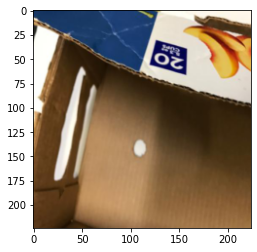

In [27]:
image = np.transpose(image, (1, 2, 0))

# Display the color image using Matplotlib
plt.imshow(image)
plt.show()

In [28]:
label ## Label/Class of the above image

0

label 0


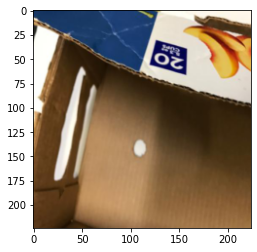

In [29]:
plt.imshow(image.squeeze())
print('label', label) #### here is another way to see the image

# 5. DATA LOADER

In [30]:
train_loader = torch.utils.data.DataLoader(
                    train_dataset,
                    batch_size=6,
                    shuffle=True)

test_loader = torch.utils.data.DataLoader(
                    test_dataset,
                    batch_size=6,
                    shuffle=True)


In [31]:
batch_sample = next(iter(train_loader)) # display one batch of the images
print(len(batch_sample)) # 2 means image and label
print(type(batch_sample))
images, labels = batch_sample
print(images.shape)
print(labels.shape)

2
<class 'list'>
torch.Size([6, 3, 224, 224])
torch.Size([6])


## VIEW SAMPLE BATCH

labels tensor([4, 2, 3, 5, 2, 0])


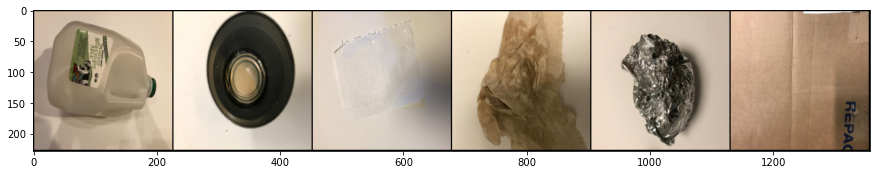

In [32]:
grid = torchvision.utils.make_grid(images, nrow=10)
plt.figure(figsize=(15,15))
plt.imshow(np.transpose(grid,(1,2,0)))
print('labels', labels)

## VIEW 50 RANDOM IMAGES FROM DATASET

In [33]:
DataSetView = torch.utils.data.DataLoader(
                    custom_dataset,
                    batch_size=50,
                    shuffle=True)

In [34]:
batch_DataSetView = next(iter(DataSetView)) # display one batch of the images
len(batch_sample) # 2 means image and label

2

In [35]:
images_DataSetView, labels_DataSetView = batch_DataSetView

In [36]:
images_DataSetView.shape

torch.Size([50, 3, 224, 224])

labels tensor([1, 2, 3, 1, 1, 3, 4, 2, 5, 0, 2, 4, 3, 4, 0, 4, 2, 0, 4, 4, 0, 0, 3, 1,
        4, 4, 3, 4, 4, 1, 3, 0, 2, 3, 5, 1, 5, 3, 0, 2, 0, 1, 1, 3, 4, 4, 2, 3,
        4, 4])


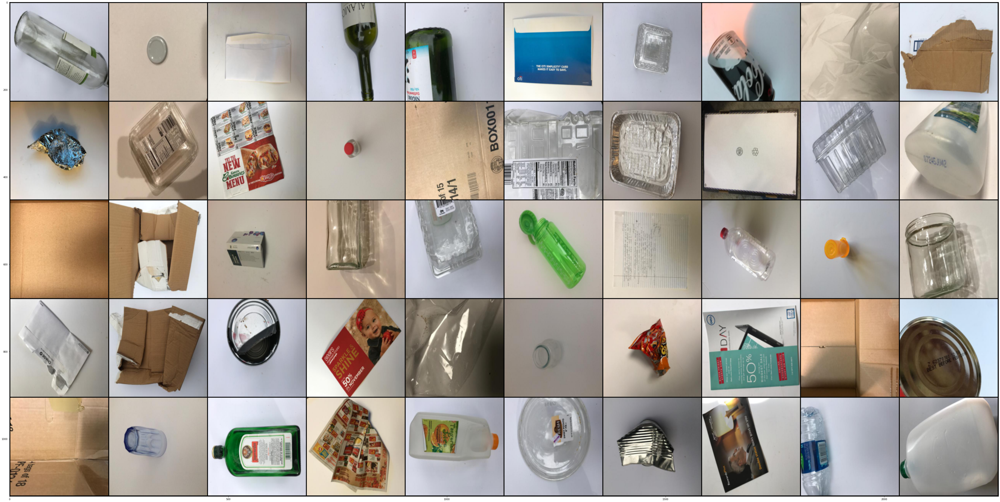

In [37]:
grid_DataSetView = torchvision.utils.make_grid(images_DataSetView, nrow=10)
plt.figure(figsize=(75,45))
plt.imshow(np.transpose(grid_DataSetView,(1,2,0)))
print('labels', labels_DataSetView)

# 6. CREATE NUERAL NETWORK ARCHITECTURE

In [20]:
class cnn_network(nn.Module):
    def __init__(self):
        super(cnn_network, self).__init__()  # Include the class name and instance
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=6, kernel_size=5)
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=12, kernel_size=5)
        self.fc1 = nn.Linear(in_features=12 * 53 * 53, out_features=120)  # Adjust based on your architecture
        self.fc2 = nn.Linear(in_features=120, out_features=60)
        self.out = nn.Linear(in_features=60, out_features=6)

    def forward(self, t):
        # 1 input layer
        t = t
        
        # 2 hidden conv layer
        t = self.conv1(t)
        t = F.relu(t)
        t = F.max_pool2d(t, kernel_size=2, stride=2)
        
        # 3 hidden conv layer
        t = self.conv2(t)
        t = F.relu(t)
        t = F.max_pool2d(t, kernel_size=2, stride=2)
        
        # 4 hidden linear layer
        t = t.view(t.size(0), -1)  # Flatten the tensor for linear layer
        t = self.fc1(t)
        t = F.relu(t)
        
        # 5 hidden linear layer
        t = self.fc2(t)
        t = F.relu(t)
        
        # 6 output layer
        t = self.out(t)

        return t


In [21]:
print(len(custom_dataset))
print(len(train_dataset))
print(len(test_dataset))


2527
2021
506


## DISPLAY NETWORK COPY 

In [22]:
network = cnn_network() ## creates an object of your network and you can visualize the network
print(network)

cnn_network(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(6, 12, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=33708, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=60, bias=True)
  (out): Linear(in_features=60, out_features=6, bias=True)
)


## NETWORK PROPERTIES 

In [23]:
print(network.conv1) ### to look at the properties of layer 1
print(network.fc1)
print(network.conv1.weight.shape)
print(network.fc1.weight.shape)
print(network.out.weight.shape)

Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
Linear(in_features=33708, out_features=120, bias=True)
torch.Size([6, 3, 5, 5])
torch.Size([120, 33708])
torch.Size([6, 60])


In [24]:
torch.set_grad_enabled(True)

## PREDICTING SAMPLE BATCH

In [25]:
batch_sample = next(iter(train_loader)) # display one batch of the images
print(len(batch_sample)) # 2 means image and label
images, labels = batch_sample
print(images.shape)

2
torch.Size([6, 3, 224, 224])


In [26]:
preds = network(images)
preds

tensor([[-0.0954,  0.0635,  0.0548,  0.0794,  0.0981,  0.0561],
        [-0.0960,  0.0652,  0.0550,  0.0784,  0.0992,  0.0565],
        [-0.0968,  0.0594,  0.0566,  0.0788,  0.1003,  0.0565],
        [-0.0968,  0.0625,  0.0551,  0.0782,  0.1001,  0.0554],
        [-0.0973,  0.0627,  0.0547,  0.0790,  0.0987,  0.0547],
        [-0.0962,  0.0614,  0.0576,  0.0792,  0.1019,  0.0515]],
       grad_fn=<AddmmBackward0>)

In [27]:
preds.argmax(dim=1)

tensor([4, 4, 4, 4, 4, 4])

In [28]:
labels

tensor([4, 3, 3, 3, 4, 5])

In [29]:
preds.argmax(dim=1).eq(labels).sum()

tensor(2)

In [30]:
def get_num_correct(preds, labels):
    return preds.argmax(dim=1).eq(labels).sum().item()

In [31]:
get_num_correct(preds, labels)

2

## COMPUTING LOSS FOR SAMPLE BATCH

In [32]:
preds = network(images)
loss = F.cross_entropy(preds, labels)
loss.item()

1.755677580833435

# 7. TRAINING WITH EPOCHS

In [33]:
network = cnn_network() ## creates an object of the cnn_network

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=5,shuffle=True) ## make batches and sent to network
optimizer = optim.Adam(network.parameters(), lr=0.001) ## updates the weights in network during back propogation. lr = alpha = learning rate

for epoch in range(10): ## runs over the network for 1 times

    total_loss = 0 ### initial loss is zero
    total_correct = 0

    for batch in train_loader: # get one batch of 100 images and labels
        images, labels = batch ### Extracting the images and labels

        preds = network(images) # pass batch ## forward propogation
        loss = F.cross_entropy(preds, labels) # calculate loss

        optimizer.zero_grad()
        loss.backward()  # calculate gradients ### backward propogation
        optimizer.step() # update weights -- here is learning 

        total_loss += loss.item()
        total_correct += get_num_correct(preds, labels)

    print('epoch:', epoch, 'total_correct:', total_correct, 'loss:', total_loss)

epoch: 0 total_correct: 517 loss: 699.8863809108734
epoch: 1 total_correct: 679 loss: 641.1702679395676
epoch: 2 total_correct: 924 loss: 539.1459526717663
epoch: 3 total_correct: 1130 loss: 456.3766767559573
epoch: 4 total_correct: 1367 loss: 349.2764149606228
epoch: 5 total_correct: 1585 loss: 239.27840581350029
epoch: 6 total_correct: 1734 loss: 157.681350680592
epoch: 7 total_correct: 1864 loss: 91.97199265005474
epoch: 8 total_correct: 1880 loss: 95.85947693967901
epoch: 9 total_correct: 1954 loss: 43.07106317744183


# 8. EVALUATION OF TRAINED MODEL

In [34]:
print("Prediction Accuracy on Train Dataset: ",total_correct/len(train_dataset)*100, "%")

Prediction Accuracy on Train Dataset:  96.68480950024741 %


## TRAIN DATASET EVALUATION

In [35]:
Accuracy = total_correct/len(train_dataset)*100

In [36]:
print("Number of correct predictions:", total_correct)
print("Total items in the dataset:", len(train_dataset))
print("Accuracy: ", Accuracy, "%")

Number of correct predictions: 1954
Total items in the dataset: 2021
Accuracy:  96.68480950024741 %


## TEST DATASET EVALUATION 

In [37]:
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=5, shuffle=True)  # DataLoader for the test dataset

network.eval()  # Set the network to evaluation mode (important for models with dropout and batch normalization)

total_correct = 0
total_items = 0

# Turn off gradient calculations for the forward pass, as we don't need to compute gradients during testing
with torch.no_grad():
    for batch in test_loader:
        images, labels = batch

        preds = network(images)  # Forward pass

        total_correct += get_num_correct(preds, labels)
        total_items += labels.size(0)

# Calculate the accuracy on the test dataset
test_accuracy = total_correct / total_items * 100
print("Prediction Accuracy on Test Dataset: {:.2f}%".format(test_accuracy))

Prediction Accuracy on Test Dataset: 44.27%


# Conclusion

In conclusion, the project results indicate that while the model performs exceptionally well on the training dataset, it got 44.27% accuracy on test dataset. Further optimization and tuning may help improve test accuracy.

In [38]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Initialize variables to collect predictions and true labels
all_preds = []
all_labels = []

# Set the model to evaluation mode
network.eval()

with torch.no_grad():
    for batch in test_loader:
        images, labels = batch
        preds = network(images)
        _, predicted = torch.max(preds, 1)  # Get class predictions
        all_preds.extend(predicted.numpy())
        all_labels.extend(labels.numpy())

# Convert lists to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

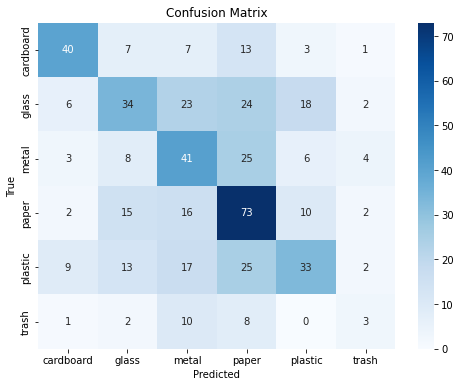

In [39]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)

# Define class labels
class_labels = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Phase II

# Using pretrained VGG 13 Model

# 1.  Import Libraries

In [50]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
from sklearn.model_selection import train_test_split

# 2. LOAD & 3.TRANSFORM DATA

In [51]:

data_dir = r'E:\MS (BA)\3rd Semester\Predictive Modeling\project\Garbage image dataset\archive\TrashType_Image_Dataset'

# Define a transformation to convert images to PyTorch tensors
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the images to the desired size
    transforms.ToTensor(),  # Convert the images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize the images
])

# Create a custom dataset from your directory
custom_dataset = datasets.ImageFolder(data_dir, transform=transform)

In [52]:
sample = next(iter(custom_dataset))

In [53]:
image, label = sample
image.shape # 3 RGB color channel, length of image and width of image

torch.Size([3, 224, 224])

# 4. TRAIN TEST SPLIT

In [6]:
# Split the dataset into training and testing sets (80% training, 20% testing)
train_dataset, test_dataset = train_test_split(custom_dataset, test_size=0.2, random_state=42)

In [54]:
print(len(custom_dataset))
print(len(train_dataset))
print(len(test_dataset))

2527
2021
506


In [55]:
sample = next(iter(train_dataset))
print(len(sample))
print(type(sample))

2
<class 'tuple'>


In [56]:
# Access the class labels
class_labels = os.listdir(data_dir)

# Print the class labels
print(class_labels)

['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


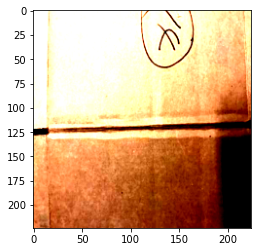

In [57]:
import matplotlib.pyplot as plt
image = np.transpose(image, (1, 2, 0))

# Display the color image using Matplotlib
plt.imshow(image)
plt.show()

In [58]:
label

0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


label 0


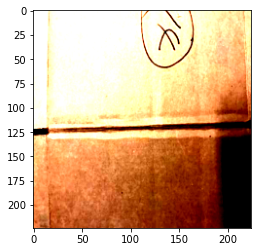

In [59]:
plt.imshow(image.squeeze())
print('label', label) #### here is another way to see the image

# Create data loaders

In [60]:
# Create data loaders
batch_size = 64
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [61]:
batch_sample = next(iter(train_loader)) # display one batch of the images
print(len(batch_sample)) # 2 means image and label
print(type(batch_sample))
images, labels = batch_sample
print(images.shape)
print(labels.shape)

2
<class 'list'>
torch.Size([64, 3, 224, 224])
torch.Size([64])


# VIEW SAMPLE BATCH

labels tensor([1, 3, 2, 4, 0, 1, 1, 1, 1, 2, 3, 0, 1, 1, 0, 3, 1, 2, 2, 3, 4, 2, 1, 5,
        1, 1, 1, 3, 2, 0, 5, 1, 0, 5, 1, 2, 2, 4, 1, 5, 3, 0, 4, 1, 4, 3, 0, 2,
        2, 2, 1, 0, 4, 0, 2, 1, 1, 5, 3, 1, 1, 2, 1, 1])


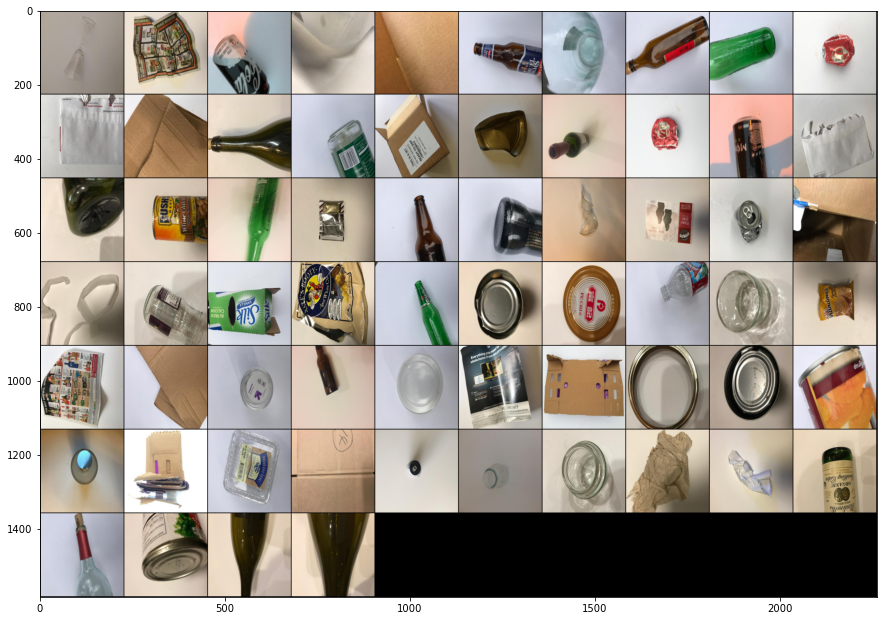

In [62]:
grid = torchvision.utils.make_grid(images, nrow=10)
plt.figure(figsize=(15,15))
plt.imshow(np.transpose(grid,(1,2,0)))
print('labels', labels)

# VIEW 50 RANDOM IMAGES FROM DATASET

In [68]:
DataSetView = torch.utils.data.DataLoader(
                    custom_dataset,
                    batch_size=50,
                    shuffle=True)

In [69]:
batch_DataSetView = next(iter(DataSetView)) # display one batch of the images
len(batch_sample) # 2 means image and label

2

In [70]:
images_DataSetView, labels_DataSetView = batch_DataSetView

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


labels tensor([1, 2, 3, 5, 1, 1, 3, 2, 4, 4, 3, 1, 0, 0, 2, 3, 1, 0, 3, 4, 3, 0, 0, 0,
        3, 3, 3, 5, 4, 1, 3, 1, 3, 3, 4, 0, 0, 5, 4, 1, 0, 1, 3, 1, 2, 2, 2, 4,
        1, 0])


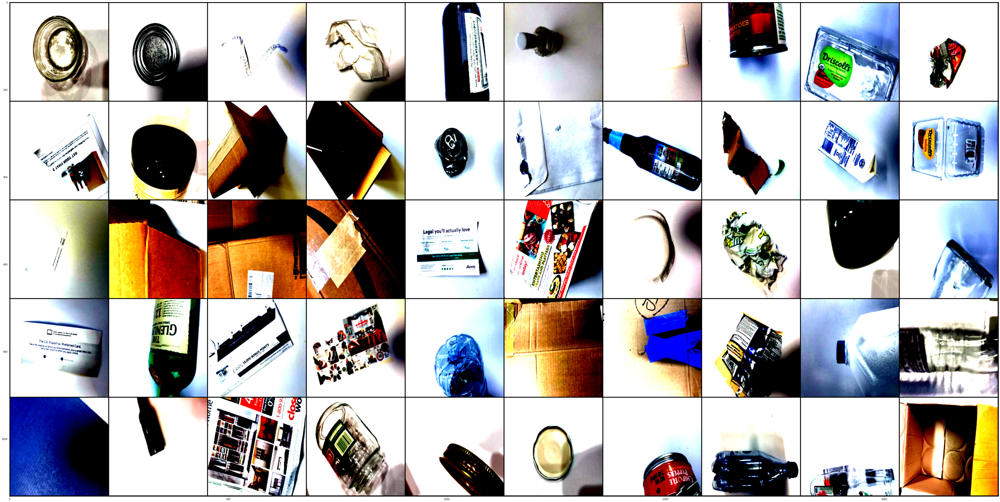

In [71]:
grid_DataSetView = torchvision.utils.make_grid(images_DataSetView, nrow=10)
plt.figure(figsize=(75,45))
plt.imshow(np.transpose(grid_DataSetView,(1,2,0)))
print('labels', labels_DataSetView)

#  6. Define the model

In [8]:
# Define the model (VGG13 in this example)
model = models.vgg13(pretrained=True)
num_classes = 6
in_features = model.classifier[6].in_features
model.classifier[6] = nn.Linear(in_features, num_classes)


C:\Users\BILAL\AppData\Roaming\Python\Python39\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\BILAL\AppData\Roaming\Python\Python39\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG13_Weights.IMAGENET1K_V1`. You can also use `weights=VGG13_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


# VGG13 Model Parameters

In [39]:
model.parameters

<bound method Module.parameters of VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Conv2d(256, 512, kernel_size=(3, 3), stride

# Set loss function and optimizer

In [9]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)


# PREDICTING SAMPLE BATCH

In [72]:
batch_sample = next(iter(train_loader)) # display one batch of the images
print(len(batch_sample)) # 2 means image and label
images, labels = batch_sample
print(images.shape)

2
torch.Size([64, 3, 224, 224])


In [74]:
preds = model(images)
preds

tensor([[-2.2083,  0.1636,  1.8857, -1.9069,  5.1966, -1.8346],
        [-0.4422, -3.6749, -4.1338,  6.2198,  3.7176,  0.3156],
        [ 2.3101, -4.4343, -5.3302,  9.0943,  0.6151, -0.7384],
        [ 2.3921, -4.3995, -4.6673, 11.6698, -1.6623, -2.1212],
        [ 7.5710, -6.1273, -5.6407,  6.0263, -1.3747, -0.2630],
        [-7.0426,  7.2802, -2.6311, -3.0208,  5.2419, -0.2793],
        [-6.5009,  3.4521,  0.1415, -3.7362,  6.4980,  0.0826],
        [-8.2301,  2.0063, -5.0844, -1.6570, 14.0001, -0.4792],
        [-4.8576,  7.3945, -3.0910, -6.6034,  6.0325,  0.1658],
        [-2.3521, -1.3536, -2.2147,  0.9005,  6.7394, -1.8666],
        [-5.7601,  7.1868, -4.1425, -5.1915,  7.7207,  1.1742],
        [-1.2862, -1.0992, -3.7745,  3.3378,  3.2678,  0.1690],
        [-7.1419, 10.2319, -4.2385, -5.0689,  6.1040,  0.9452],
        [ 8.6649, -5.2870, -5.1283,  5.9055, -0.8065, -0.7650],
        [-5.9897, 13.5110, -6.3760, -2.0530,  3.6370, -2.6885],
        [-6.8311,  3.4492, -5.3368, -4.4

# 7. TRAINING WITH EPOCHS

In [10]:

# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {running_loss / len(train_loader)}")


Epoch 1/10, Loss: 1.1365838646888733
Epoch 2/10, Loss: 0.5444988459348679
Epoch 3/10, Loss: 0.35983312129974365
Epoch 4/10, Loss: 0.23774458141997457
Epoch 5/10, Loss: 0.15245095524005592
Epoch 6/10, Loss: 0.11869443918112665
Epoch 7/10, Loss: 0.06942158850142732
Epoch 8/10, Loss: 0.05554197711171582
Epoch 9/10, Loss: 0.04056418509571813
Epoch 10/10, Loss: 0.035925656848121434


# EVALUATION OF MODEL

In [11]:

# Evaluation
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = 100 * correct / total
print(f"Test Accuracy: {accuracy:.2f}%")

Test Accuracy: 91.11%


# Conclusion

In conclusion, the developed Garbage image classification model based on pretrained VGG model can effectively categorize garbage images into one of the six defined classes.
The project results indicate the model performs exceptionally well on the test dataset and got 91.11% accracy on test dataset, it exhibits generalization on the test dataset.

In [14]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Initialize variables to collect predictions and true labels
all_preds = []
all_labels = []

# Set the model to evaluation mode
model.eval()

with torch.no_grad():
    for batch in test_loader:
        images, labels = batch
        preds = model(images)
        _, predicted = torch.max(preds, 1)  # Get class predictions
        all_preds.extend(predicted.numpy())
        all_labels.extend(labels.numpy())

# Convert lists to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

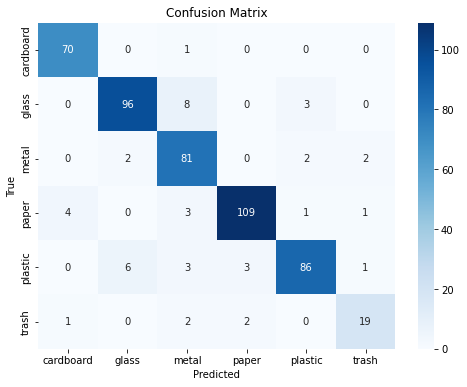

In [16]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
# Calculate the confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)

# Define class labels
class_labels = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()